
# CSCI E-25
## Extracting Features From Images
### Steve Elston

Feature extraction from images is a fundamental aspect of computer vision. Image features must be extracted for many computer vision methods. Just a few of these are:    
1. Object recognition. 
2. Stitching images together.   
3. Locating and identifying objects in images.    
4. Models of motion from a series of images.     
5. Stereo vision and depth estimation.    

In these exercises we focus on classical methods for extracting features from images. In state-of-the-art practice features are created using deep neural networks. Will address learning features with deep neural networks extensively latter. Rest assured that some background in classical methods will help you understand and appreciate the deep learning methods.     

To get started, execute the code in the cell below to import the packages you will need for the exercises.

In [4]:
import skimage 
from skimage import data
from skimage.filters.rank import equalize, entropy
import skimage.filters as skfilters
import skimage.feature as feature
import skimage.segmentation as segmentation
import skimage.morphology as morphology
import skimage.transform as transform
import skimage.util as util
from skimage.color import rgb2gray
from skimage import exposure
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
skimage.__version__

'0.19.3'

## Preparing the Image     

Regardless of the methods used an image must be prepared for feature extraction. Often many steps of correcting and filtering the image are required for proper feature extraction. An important step is the adjustment of the spectrum of the image. We need the spectrum to be as wide as possible. We call the transformation  **pre-whitening**. The broad spectrum is considered white light has all spectral components equally represented. We have already discussed the process of whitening the spectrum of images, contrast improvement. An image with high contrast has a broad spectrum.              

The cat image requires little preprocessing, beyond pre-whitening. Execute the code in the cell below to load and prepare the cat image.

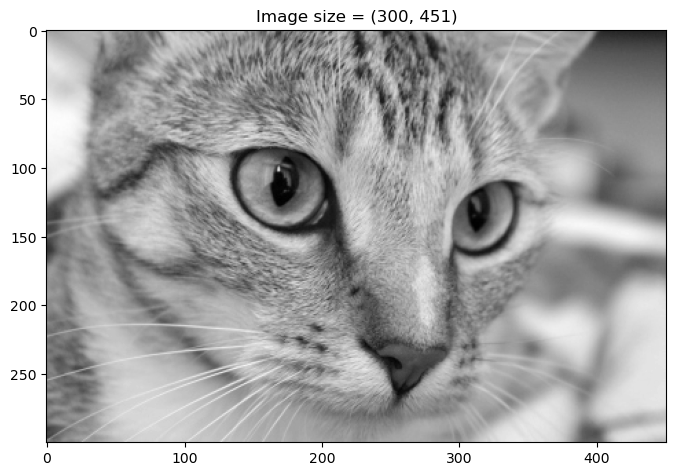

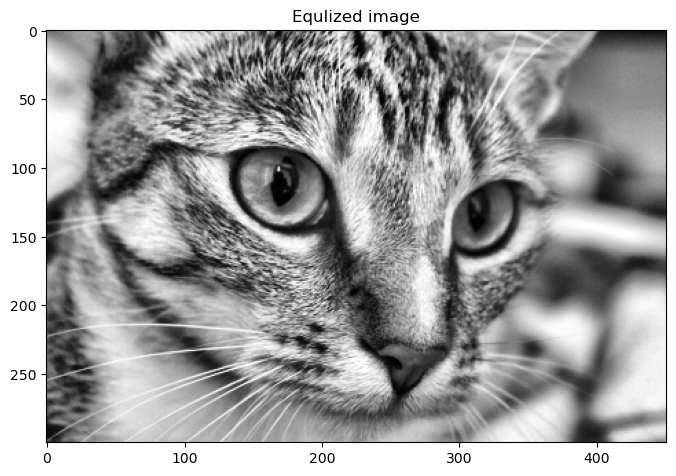

In [6]:
def plot_grayscale(img, title, h=8):
    plt.figure(figsize=(h, h))
    _=plt.imshow(img, cmap=plt.get_cmap('gray'))
    _=plt.title(title)

cat_image = rgb2gray(data.cat())
plot_grayscale(cat_image, 'Image size = ' + str(cat_image.shape))

cat_grayscale_equalized = exposure.equalize_adapthist(cat_image)
plot_grayscale(cat_grayscale_equalized, 'Equlized image')

> **Important note!** Unless otherwise stated, the `cat_grayscale_equalized` image should be used for subsequent exercises. 

## Edge Detection  

**Edges** are a fundamental feature of am image. Edges are characterized by rapid changes in the intensity and are therefore associated with **high gradients**. The rapid change in intensity levels also means that the spectrum around an edge will have high-frequency components. 

We can take advantage of the broad spectrum at edge features to create an edge detector algorithm. Recall that a Gaussian filter acts is low-pass, reducing the high frequency components. If we take the difference of the Gaussian filters with different bandwidths we can detect edges.              

> **Exercise 3.1:** To gain a bit of understanding from a simple case you will create a simple one dimensional example of an edge detector. In this case, you will apply a convolutional gradient operator to a square wave function that is first positive and then negative. Aficionados of obscure functions will notice this is a Harr basis function (Harr, 1909). You will find and display the changes in gradient of this function by the following steps:   
> 1. Create the 1-d convolution operator as a Numpy array: $[1.0,-2.0,1.0]$.
> 2. Convolve the `series` with the operator using  the [numpy.convolve](https://numpy.org/doc/stable/reference/generated/numpy.convolve.html) function. Make sure to set the `mode='same'` argument so the resulting series is the same length as the original.  
> 3. Plot the result with the `plot_conv` function provided. 

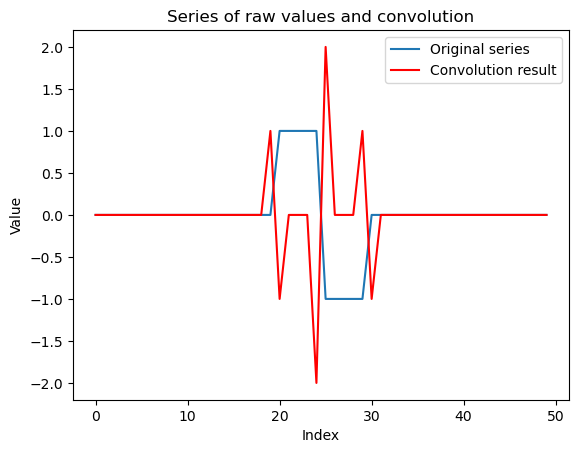

In [7]:
def plot_conv(series, conv, span):
    x = list(range(series.shape[0]))
    plt.plot(x, series, label = 'Original series')
    plt.plot(x, conv, color = 'red', label = 'Convolution result')
    plt.legend()
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title('Series of raw values and convolution')

series = np.concatenate((np.zeros((20,)), np.zeros((5,)) + 1.0, np.zeros((5,)) - 1.0, np.zeros((20,))))    
    
##  Your code goes here    
result = np.convolve(series, [1.0, -2.0, 1], mode='same')

plot_conv(series, result, 3)  

> Examine the plot and answer the following questions:   
> 1. Why are the 3-point convolution operator values correct in terms of sign, and normalization?   
> 2. Does the magnitude of the resulting series correctly represent the gradient of the original series, and why?  
> **End of exercise.**

> **Answers:**   
> 1. We want this convolution to sum to zero. thus, the values must be correct with regards to sign.      
> 2. The resulting series looks more like the inverse of the gradient.  The major decrease in the series (at index ~ 25) sees the largest increase in the resulting series, which is the opposite of how I would have thought the graident would behave.

> **Exercise 3-2:** You will now create and test an edge detector using the difference of Gaussian filtered images. Starting with the equalized gray-scale cat image, perform the following steps:
> 1. Define a first vector of values of $\sigma_1 = [1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0]$ and a second value of $\sigma_2 = 0.5$. 
> 2. For each value of the $\sigma_1$ compute an image which is the difference between the Gaussian filtered images computed with $\sigma_1$ and $\sigma_2$.
> 3. Display each resulting image, with the value of $\sigma_1$ in the title.

In [8]:
test = skimage.filters.gaussian(cat_grayscale_equalized, sigma=1)
test

array([[0.46273246, 0.45597562, 0.44603276, ..., 0.0685401 , 0.06515627,
        0.06640955],
       [0.48350126, 0.47390674, 0.46090675, ..., 0.07691415, 0.07784402,
        0.08240133],
       [0.51368098, 0.50103816, 0.48512198, ..., 0.09134467, 0.09534711,
        0.10092501],
       ...,
       [0.15730944, 0.19319924, 0.22834647, ..., 0.66991013, 0.66997794,
        0.66905474],
       [0.28282119, 0.28807122, 0.27533655, ..., 0.61751533, 0.62054302,
        0.6227702 ],
       [0.36647536, 0.3198124 , 0.26589166, ..., 0.57480026, 0.5799031 ,
        0.58378668]])

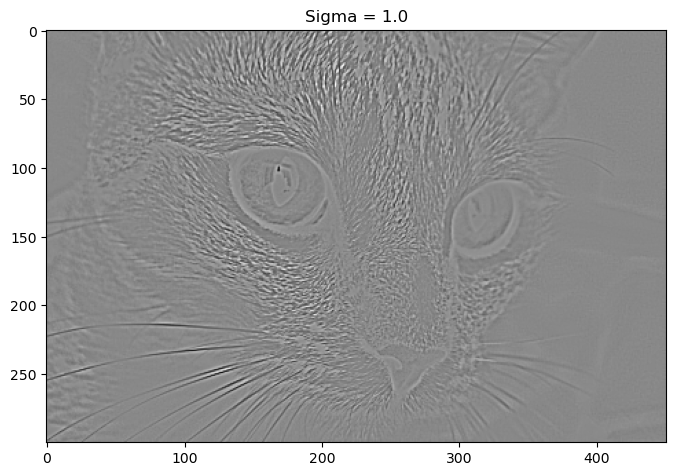

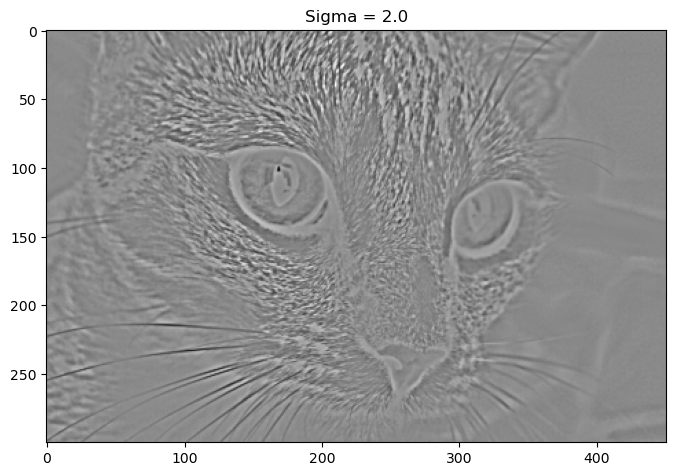

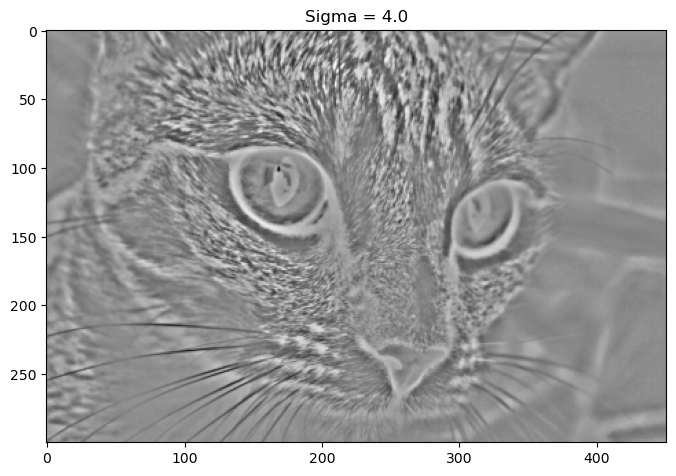

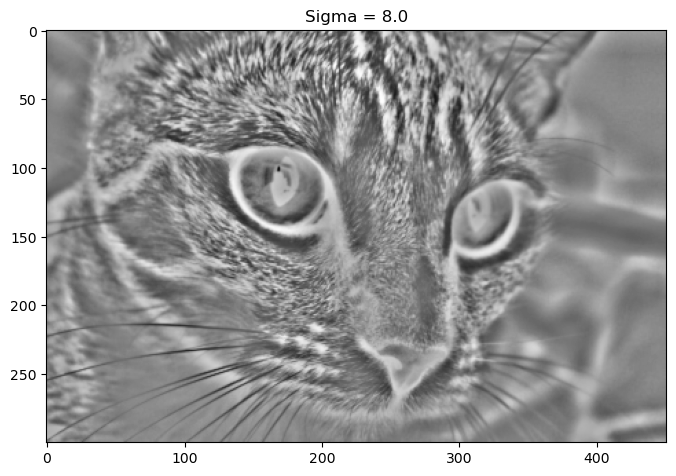

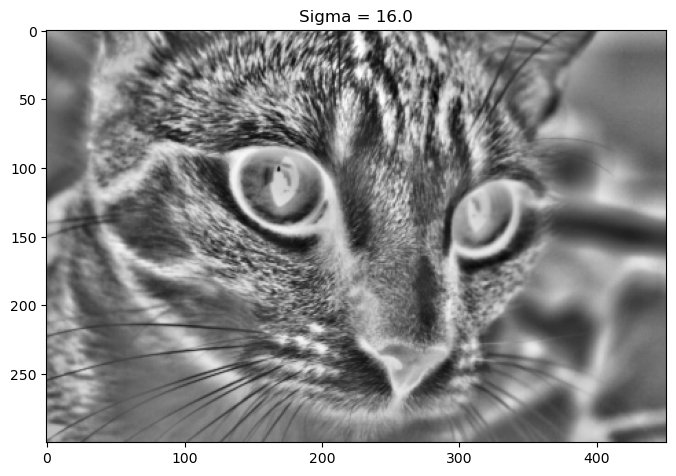

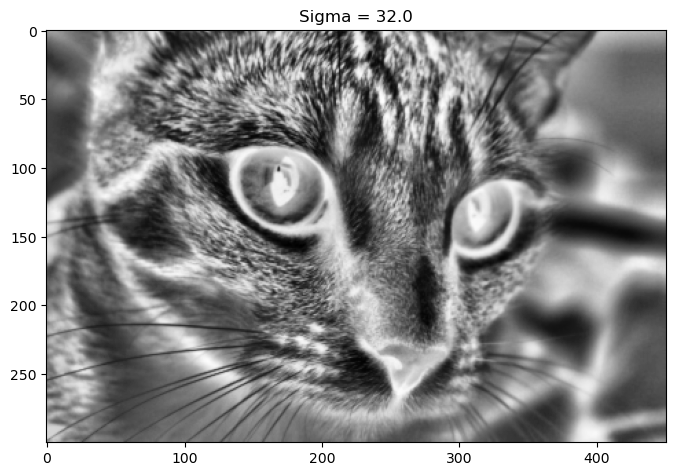

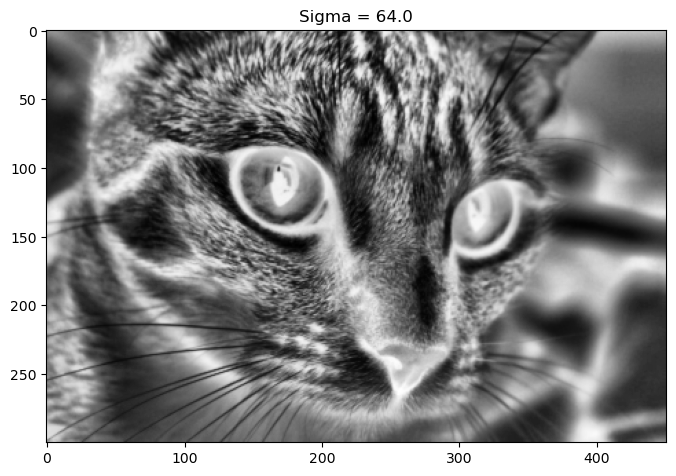

In [9]:
sigma1 = [1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0]
sigma2 = 0.5
##  Your code goes here  

for s in sigma1:
    differenced = skimage.filters.gaussian(cat_grayscale_equalized, sigma=s) - skimage.filters.gaussian(cat_grayscale_equalized, sigma=sigma2)

    plot_grayscale(differenced, f'Sigma = {s}')

> Answer the following questions:
> 1. How does the gradient measurement of the images change as the value of $\sigma_1$ changes and what does this tell you about the scale of features in the image?    
> 2. Given the bandwidths of these Gaussian filters compared to the filter with $\sigma = 0.5$, do the changes of gradient measured make sense and why?     
> 3. Does it appear that the difference of Gaussian filters has detected high gradients with different orientations on the image, and why?  
> **End of exercise.** 

> **Answers:**     
> 1.  As gradient increases in sigma, we start to see only the most dramatic of features/textures while the finer features/textures fade away.  Take for instance the largest sigma (the last picture). We can no longer see the individual whisps of fur but the dark nose is now much clearer against the light background.     
> 2.   I think it makes sense. The difference in the sigma is effectively the difference in the textures present in the image. Thus, for an image where we have both corse and fine textrues, I think that having sigmas that increase at such a dramatic scale makes sense.  If you were tryingt o discerne between different fine textures, then I dn't think the scale would make sense.  
> 3.   Yes! again, I look to the difference between the larger nose and the smaller fur strands.  The larger orientation of the filter is showing the larger features against the background.

> **Exercise 3-3:** One approach to finding edges is to look for areas of maximum gradient in an image. The difference of Gaussian filters has a strong response to large gradients in image intensity that define edges. In many cases a boolean indicator of an edge is required. To create such an edge indicator from the difference of Gaussian filtered images (equalized gray-scale) with $\sigma_1 = 1.0$ and $\sigma_2 = 0.5$ perform the following steps:    
> 1 Use the [skimage.filters.threshold_otsu](https://scikit-image.org/docs/stable/api/skimage.filters.html#skimage.filters.threshold_otsu) function to compute a threshold value for the gradient.       
> 2. Apply the threshold and create an image of boolean type.   
> 3. Display the boolean image.

-0.021048962666821547


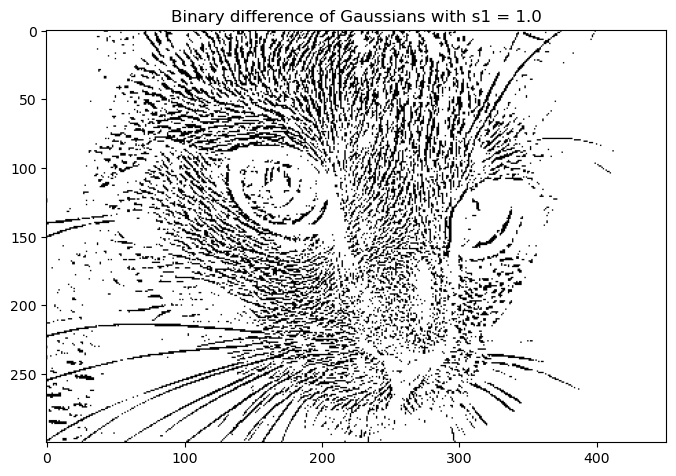

In [10]:
s1=1.0
##  Your code goes here  


cat_gaussian_difference = skimage.filters.gaussian(cat_grayscale_equalized, sigma=s1) - skimage.filters.gaussian(cat_grayscale_equalized, sigma=sigma2)
threshold = skimage.filters.threshold_otsu(cat_gaussian_difference)

print(threshold)
cat_binary_gaussian = cat_gaussian_difference >= threshold
cat_binary_gaussian = cat_binary_gaussian.astype(bool)
plot_grayscale(cat_binary_gaussian, 'Binary difference of Gaussians with s1 = ' + str(s1))

> Examine the results and answer the following questions:     
> 1. Has the binarization process captured the edges at all possible orientations, and why?     
> 2. Based on your observation, do you think the edge features are sufficient to identify the animal in the image as a cat within reasonable certainty?     
> **End of exercise.**

> **Answers:**   
> 1.  I think it has captured most of the possible orientations. It does not appear to show the frame of the face directly, which is funny because you would think that the sharp contrast between face and non-face would have shown up. This is probably because the background does not have such a sharp contrast. Other than than, I think it has done a good job.     
> 2.  I hesistate to say anything with certainly, but I do think this can be identified as a cat. 

Now that you have a bit of experience with edge detection, we will explore a few of the many commonly used edge detection algorithms. As you proceed notice how different algorithms produce different results. 

### Sobel edge detector   

The Sobel edge detector uses the gradients of the pixel values to find edges. Edges are characterized by high gradient magnitude.  

Like many feature detectors, a thresholding process must be applied to the gradients found with the Sobel filter. The result is a binary image showing the detected edges. The higher the threshold value, the fewer edge features that will be displayed. This is an example of **nonmaximal suppression**, a widely used method to filter features in computer vision.   

> **Exercise 3-4:** The Sobel filter is another form of edge detector. You will now apply the [skimage.filters.sobel](https://scikit-image.org/docs/dev/api/skimage.filters.html#skimage.filters.sobel) function to the equalized gray-scale cat image. In this case you will simply compute the norm and not the directions. Then, display the result.

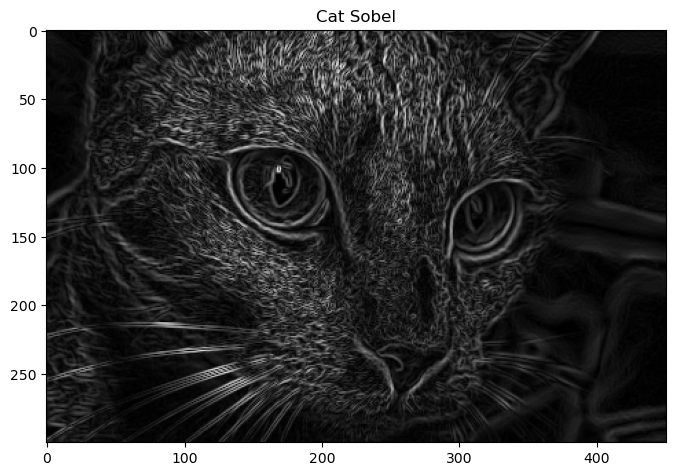

In [13]:
##  Your code goes here  
cat_sobel = skimage.filters.sobel(cat_grayscale_equalized)
plot_grayscale(cat_sobel, "Cat Sobel")

> 3. To examine the density of the Sobel filter output, execute the code in the cell below.   

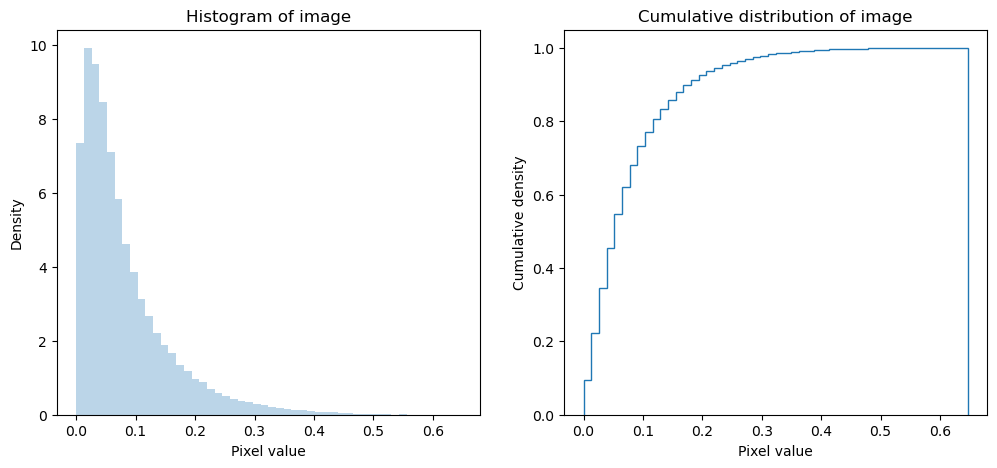

In [14]:
def plot_gray_scale_distribution(img):
    '''Function plots histograms a gray scale image along 
    with the cumulative distribution'''
    fig, ax = plt.subplots(1,2, figsize=(12, 5))
    ax[0].hist(img.flatten(), bins=50, density=True, alpha=0.3)
    ax[0].set_title('Histogram of image')
    ax[0].set_xlabel('Pixel value')
    ax[0].set_ylabel('Density')
    ax[1].hist(img.flatten(), bins=50, density=True, cumulative=True, histtype='step')
    ax[1].set_title('Cumulative distribution of image')  
    ax[1].set_xlabel('Pixel value')
    ax[1].set_ylabel('Cumulative density') 
    plt.show()

plot_gray_scale_distribution(cat_sobel)

> 4. Next compute the binary image use the [skimage.filters.threshold_otsu](https://scikit-image.org/docs/stable/api/skimage.filters.html#skimage.filters.threshold_otsu) function to find a threshold. In a loop itterate over multipliers $[1.0,2.0,3.0]$. For each multiplier, apply the product of the multiplier times the threshold found and display the result. Makes sure you display the threshold value for each image.  **Hint:** Notice that you can biniarize the image by taking pixels greater than or equal to or less than or equal to the threshold. 

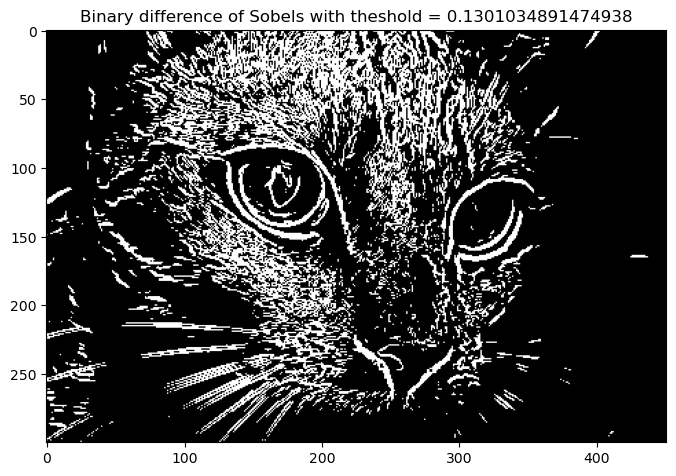

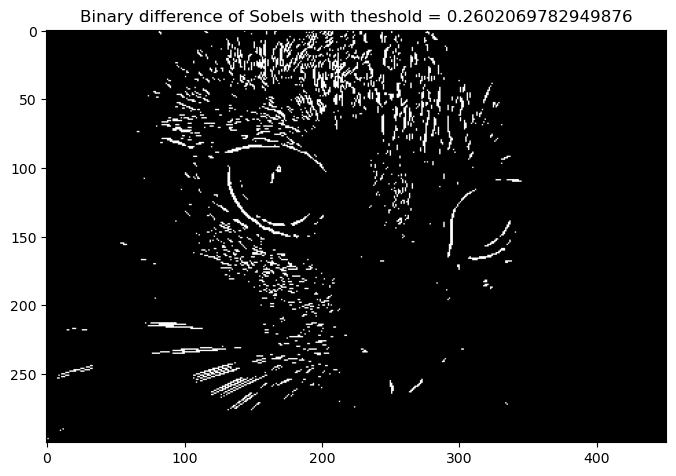

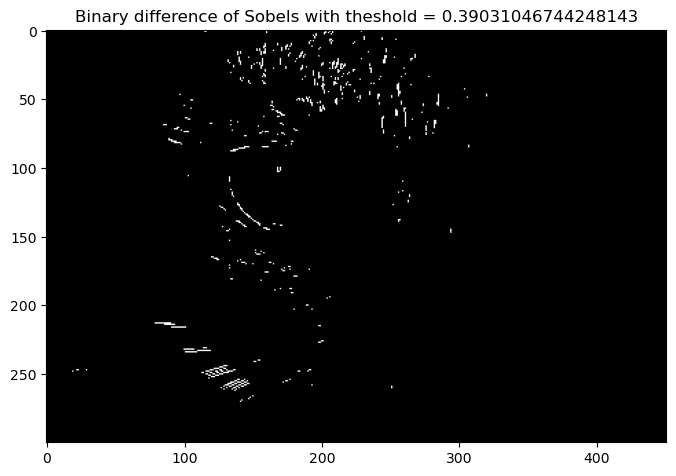

In [16]:
##  Your code goes here  

threshold = skimage.filters.threshold_otsu(cat_sobel)

for mult in [1.0, 2.0, 3.0]:

    cat_binary_sobel = cat_sobel >= threshold*mult
    cat_binary_sobel = cat_binary_sobel.astype(bool)
    plot_grayscale(cat_binary_sobel, 'Binary difference of Sobels with theshold = ' + str(threshold*mult))


> Compare the edges found with the Sobel filter with those found by the difference of Gaussian filters. Answer the following questions:   
> 1. Which aspects of the edges found by the two methods are substantially similar? 
> 2. How do the edge features detected by the two methods differ, in particular in terms of texture, continuity, compactness, etc? 
> 3. How do the edges found with the Sobel filter change with the threshold value, and why does this result make sense?   

> **Answers:**   
> 1.   For the first two sobel filters, we generally see the shape of the eye sockets, the nose, and the whiskers. For the thrid sobel, we do not see very much of anything.    
> 2.      
> 3.   As teh theshold value increases, we see only the edges that are more vertical or horizontal. This makes sense because the sobel filter applies a sharp contrast across the x, and y axes and a weaker contrast along the diagonals. Thus, as we increase the theshold, we loost lots of these diagonal edges.    

### Canny edge detector

As a point of comparison, run the code in the cell below to see the results of the Canny filter edge detector. 

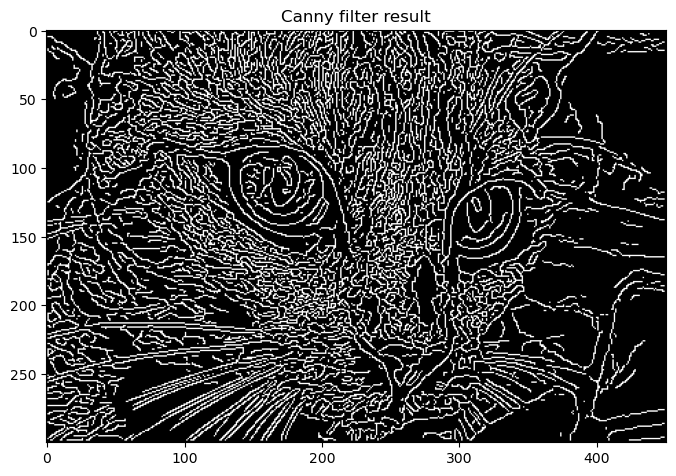

In [17]:
cat_canny = feature.canny(cat_grayscale_equalized)
plot_grayscale(cat_canny, 'Canny filter result')

Compare the edges found with the Canney operator to those found with the Sobel algorithm. Notice that the edges found with Canney are thinner. Many parts of the cat's face, like the facial hair patterns form closed or nearly closed shapes, outlining the edge of each pattern element.  

## Corner Detection    

Along with edges, corners are another fundamental feature of images. Detection of corners is fundamentally more difficult than edges:   
1. Corners are 2-dimensional features, and require more than just a first order gradient for detection.     
2. Corners orientation based on the directions of edges forming them.     
3. The angel forming the corner is a fundamental characteristic and changing the angel changes the characteristic of the corner.     
As a result of these fundamental characteristics, corner detectors must be based on metrics of multi-dimensional changes in intensity. As an example, the **Sobel** edge detector is a $2 \times 2$ array of all possible second partial derivatives. This formulation allows us to determine both the presence and the orientation (direction) of corners.            

> **Exercise 3-5:** The Harris corner detector is one of the many widely use algorithms to detect corner features in images. The detector finds a set of x-y coordinates for each corner that meets a threshold of minimum distance. The threshold is used to perform nonmaximal suppression. Apply the [skimage.feature.corner_harris](https://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.corner_harris) function to the equalized gray scale cat image by the following steps:
> 1. Apply the Harris corner detector to the equalized cat gray-scale image.
> 2. Iterate over values of the `min_distance` argument, $[1,3,5,9,12,20]$ and then perform tee steps below.       
> 3. Use the [skimage.features.corner_peaks](https://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.corner_peaks) to filter the corner features using the `min_distance` value. 
> 4. Print the minimum distance and the number of corner features the filtering.
> 5. Side by side, plot the gray-scale and the gradient image computed with the difference of Gaussian filtered images with $\sigma_1 = 2.0$ and $\sigma_2 = 0.5$. Superimpose on both images the locations of the corners detected using a '+' marker.

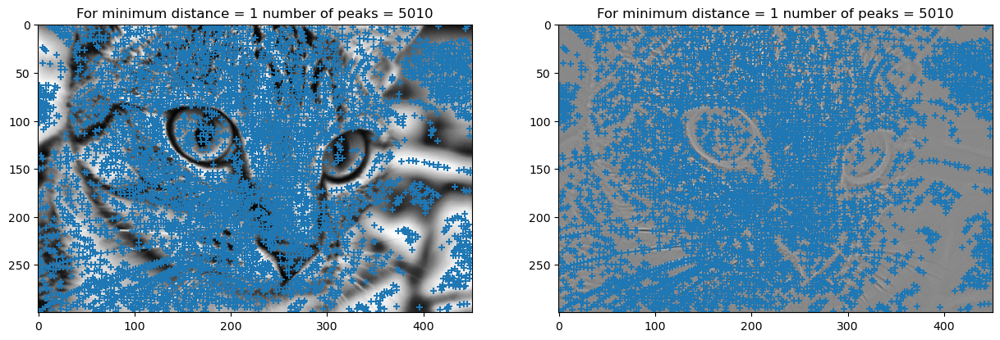

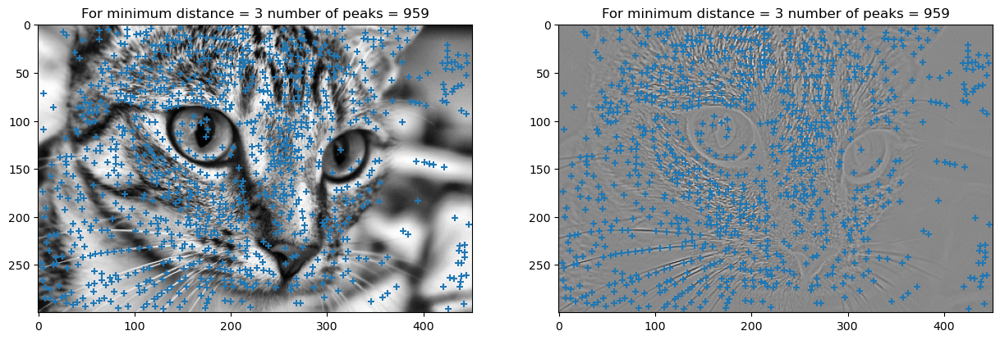

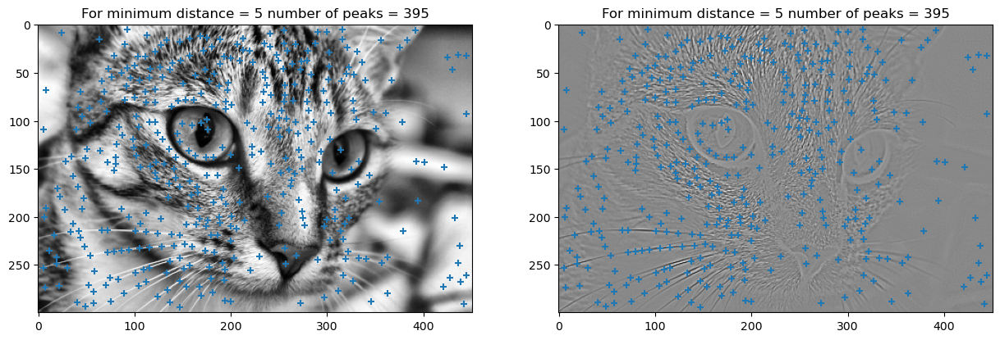

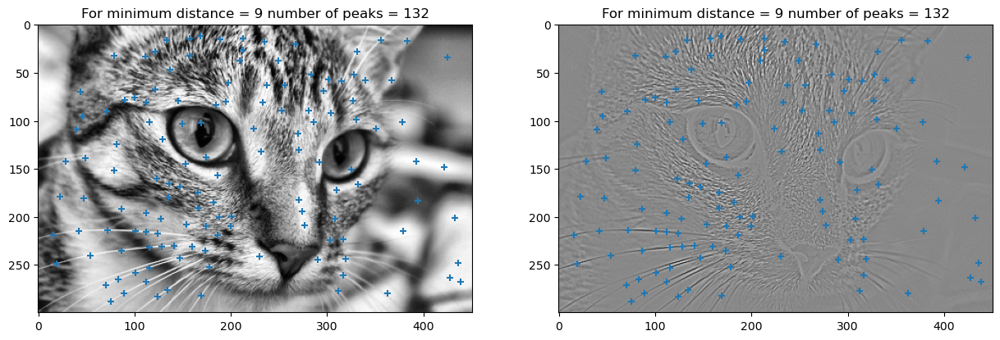

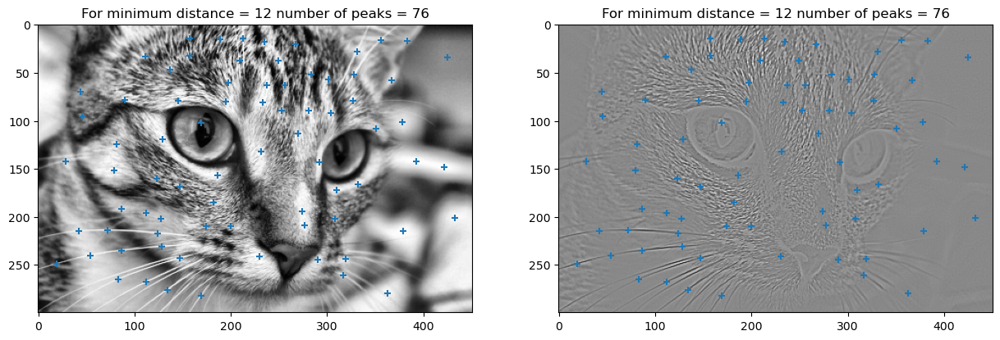

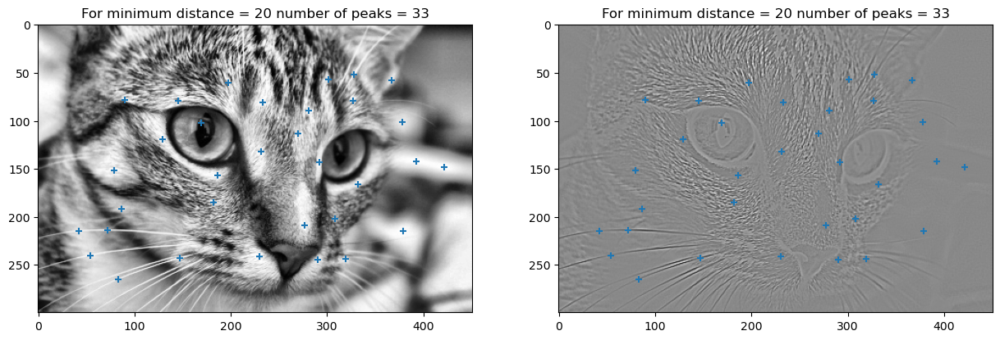

In [26]:
##  Your code goes here  
for distance in [1,3, 5, 9, 12, 20]:
    cat_harris_peaks = skimage.feature.corner_peaks(cat_grayscale_equalized, distance)

    fig, ax = plt.subplots(1, 2, figsize=(15,15))
    _=ax[0].imshow(cat_grayscale_equalized, cmap=plt.get_cmap('gray'))
    _=ax[0].scatter(cat_harris_peaks[:,1], cat_harris_peaks[:,0], marker='+')
    _=ax[0].set_title('For minimum distance = ' + str(distance) + ' number of peaks = ' + str(cat_harris_peaks.shape[0]))

    _=ax[1].imshow(cat_gaussian_difference, cmap=plt.get_cmap('gray'))
    _=ax[1].scatter(cat_harris_peaks[:,1], cat_harris_peaks[:,0], marker='+')
    _=ax[1].set_title('For minimum distance = ' + str(distance) + ' number of peaks = ' + str(cat_harris_peaks.shape[0]))

> Examine the results and images and answer these questions:    
> 1. How can you describe the change in the number of corner features as the minimum distance is increased, and why?  
> 2. Do the features that remain as the minimum distance increases appear more robust (or obviously corners to the eye) given the gradient computed with the difference of Gaussians?   
> 3. Consider a trade-off between using a large set of features which may better represent a specific image vs. a sparser but more robust set of features. How might you decide how to optimally filter the features?   

> **Answers:**    
> 1.   The number of corner features decreases as the minimum distance increases. This is because we are requiring larger and larger eigenvalues in order for a point to count as an edge, so we are naturally going to reduce the number of points that meet this requirement.
> 2.    I think they do. I can mostly see the sharp corner that was detected by the harris method when looking at the differenced gaussian.
> 3.    The basic trade-off is Bias v. Variance. If you have a large number of features, are necessarily going to build a more robust in-sample model. However, your model may be overfitting the training data and may therefore not be generalizable.  One possible approach would be to build a penalty function when including another corner (similar to an Adj-R^2 calulation). 

### Eigenvalues and Corner Detection     

Now that you have worked with a corner detection algorithm, you will create your own using eigenvalues. This algorithm is a simplified version of the well-known SIFT algorithm. The algorithm uses the ratio of the eigenvalues to find corners with changes in gradient. The steps of this algorithm are:    
1. The Hessian for each pixel in the image is computed using the operator span specified, $\sigma$.   
2. The eigenvalues of the Hessians are computed.  
3. The ratio of the largest to the second eigenvalue is computed.   
4. The eigenvalue ratio is thresholded to reduce the number of features. 

> **Exercise 3-6:** You will now implement the corner detection and examine the results by the following steps:   
> 1. Compute the Hessian of the equalized gray-scale cat image using [skimage.feature.hessian_matrix](https://scikit-image.org/docs/stable/api/skimage.feature.html#skimage.feature.hessian_matrix), iterated over values of $\sigma = [0.2,0.5,1.0,2.0,4.0]$.    
> 2. For each Hessian compute the eigenvalues using [skimage.feature.hessian_matrix_eigvals](https://scikit-image.org/docs/stable/api/skimage.feature.html#skimage.feature.hessian_matrix_eigvals).    
> 3. Compute the ratio of the magnitudes or absolute values of the first and second eigenvalues. These values can be found in the first (largest) and second elements of the list returned by the `hessina_matrix_eigvals` function.   
> 4. Apply a threshold of $0.01$ to the largest largest eigenvalues. If the larges eigenvalue is less than the threshold set the eigenvalue ratio to $10^{-6}$.   
> 5. Display images for the each of the 3 components of the Hessian, $[HRR, HRC, HCC]$, along with the image of the log of the thresholded eigenvalue ratio. Make sure to label all images with the operator span, each of the Hessian components, or log eigenvalue ratio.    

In [65]:
threshold = 0.01

hessian = skimage.feature.hessian_matrix(cat_grayscale_equalized, sigma=0.5)
eigvals = skimage.feature.hessian_matrix_eigvals(hessian)

firsteig_thesholded = eigvals[0]<threshold
eig_ratio = abs(eigvals[0])/abs(eigvals[1])
#eig_ratio[firsteig_thesholded]=10e-6

In [67]:
eig_ratio.shape

(300, 451)

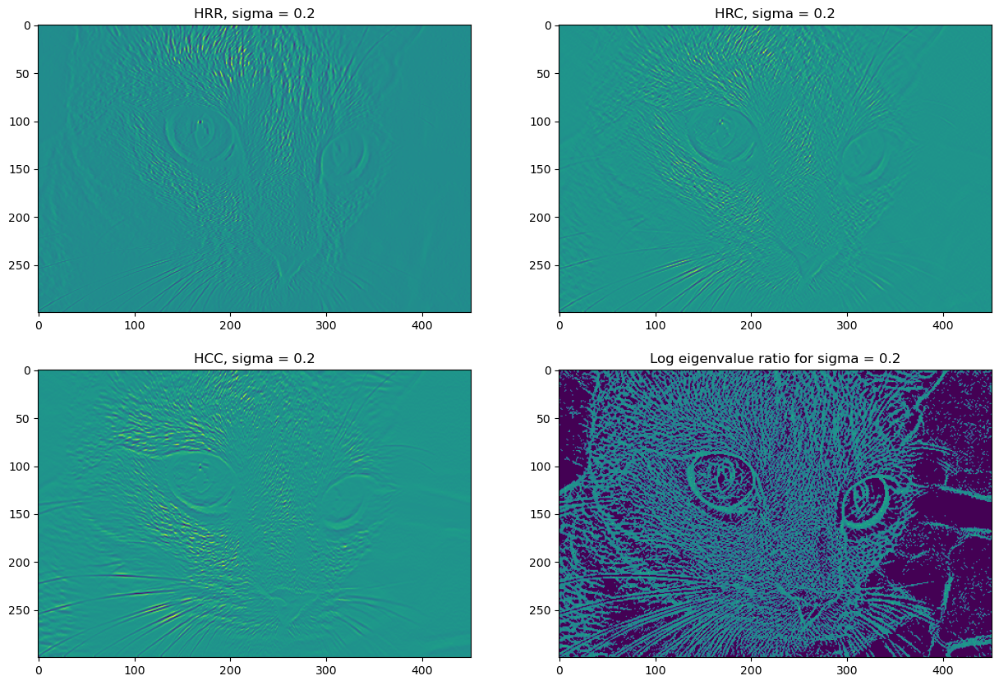

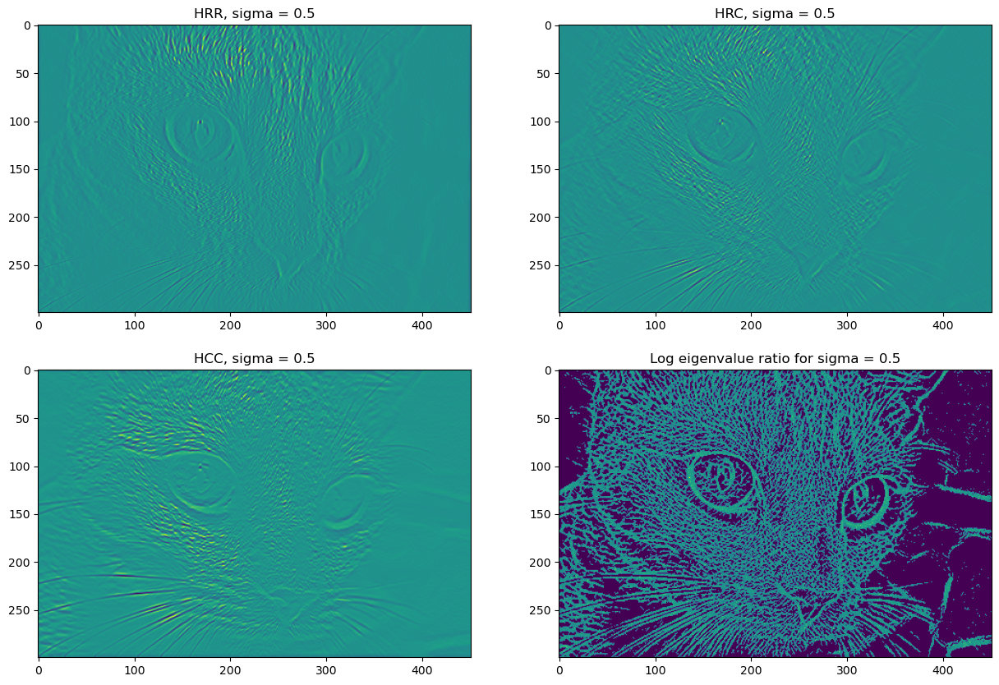

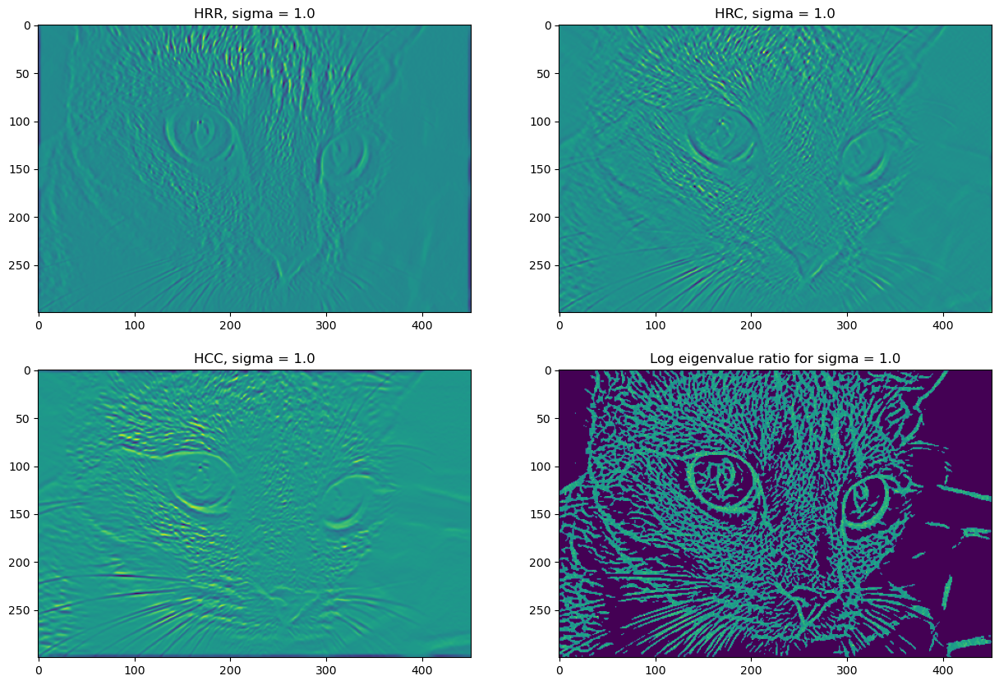

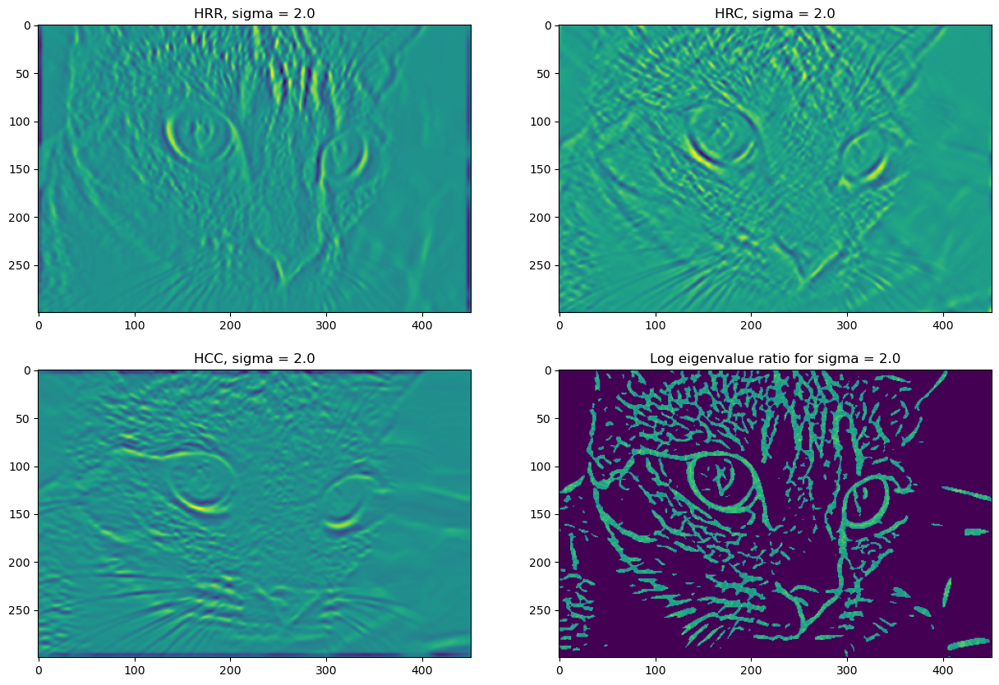

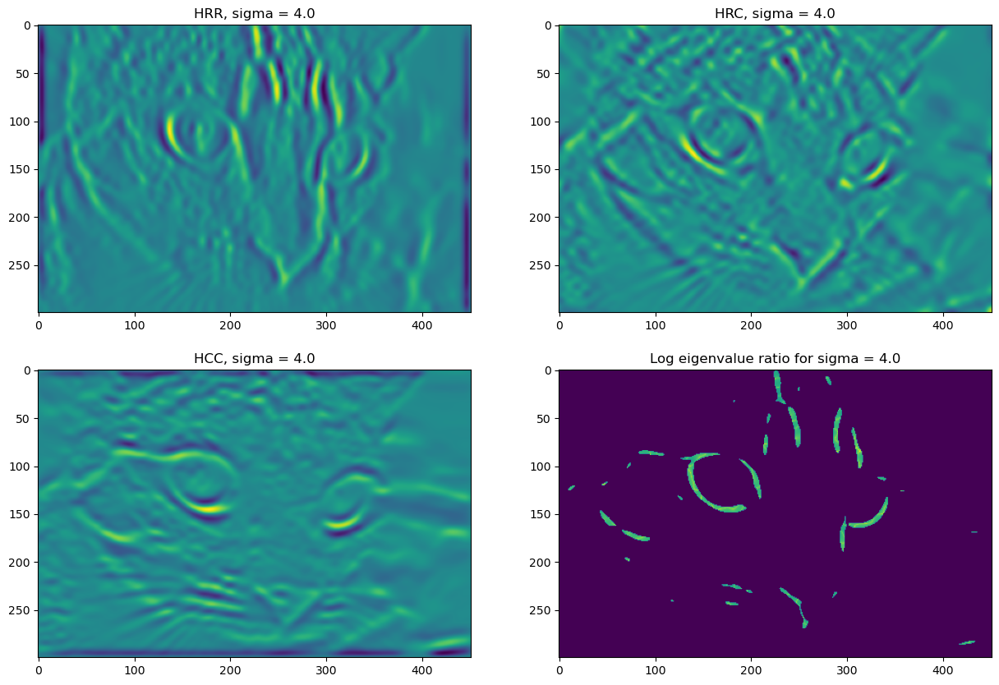

In [68]:
sigma_list = [0.2,0.5,1.0,2.0,4.0]
threshold = 0.01
##  Your code goes here  
for sigma in sigma_list:
    hessian = skimage.feature.hessian_matrix(cat_grayscale_equalized, sigma)
    eigvals = skimage.feature.hessian_matrix_eigvals(hessian)

    firsteig_thesholded = eigvals[0]<threshold
    eig_ratio = abs(eigvals[0])/abs(eigvals[1])
    eig_ratio[firsteig_thesholded]=10e-6



    fig, ax = plt.subplots(2, 2, figsize=(15,10))
    ax = ax.flatten()
    ax[0].imshow(hessian[0])
    ax[0].set_title('HRR, sigma = ' + str(sigma))
    ax[1].imshow(hessian[1])
    ax[1].set_title('HRC, sigma = ' + str(sigma))
    ax[2].imshow(hessian[2])
    ax[2].set_title('HCC, sigma = ' + str(sigma))
    _=ax[3].imshow(np.log(eig_ratio)) #, cmap=plt.get_cmap('gray')
    _=ax[3].set_title('Log eigenvalue ratio for sigma = ' + str(sigma))
    _=plt.show()

> Answer the following questions:   
> 1. How can you describe the how the components of the Hessian change as the span of the operator, $\sigma$, changes and why?
> 2. What differences can you see between the components of the Hessian and why? *Hint*, pay careful attention to the orientations of the detected features.    
> 3. What differences do you see in the feature image as the span of the Hessian operator, $\sigma$, changes and why?
> **End of exercise**.

> **Answers:**    
> 1.  As sigma increases, the HRC is finding very strongly the vertical components and the HCC is finding the horizontal components. THe HRC seems to be somewhere in the middle. The resulting eigenvalue ratio is finding only the corners that have thick horizontal component, vertical components or both, as in the cases of the eye sockets.     
> 2.  The HRC is finding strong vertical and the HCC is finding stong horizontal.      
> 3.  THe edges are getting thicker and have those strong vertical/horizontal components.    

## Interest Point Descriptors   

In many computer vision applications, including image stitching, stereo vision, and flow (motion tracking), require the unique identification of **interest points** or **key points**. 

### The HOG Algorithm

The orientation of corners can be used as part of a representation or feature map of an image. As with corner detection, a great many algorithms for determining corner orientation have been developed. Here, we will only work with the **HOG** or **histograms of oriented gradients** algorithm. The algorithm finds the directional bin with maximum value for a histogram of the gradients over patches of the image.  

The [skimage.feature.hog](https://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hog) function returns a list. The first element of the list is a vector of the magnitude of the gradients. The second element of the list is a $2 \times 2$ array of orientation vectors. When a visualization is performed, the long axis of the markers shows the orientation and the width of the marker indicates the magnitude of the gradient.      

> **Exercise 3-7:** You will now apply the HOG algorithm to the equalized gray-scale cat image. You will compare the results of using a different number of pixels per cell to estimate the histogram of 9 orientations by the following steps:
> 1. Iterate over tuples for the `pixels_per_cell` argument with dimensions, $[(4,4), (8,8), (16,16), (32,32)]$ for the convolutional operator, and for each tuple do the rest of these steps.
> 2. Compute the gradient orientations using the `pixels_per_cell=pixels`and with `visualize=True` arguments.
> 3. Print the pixels per cell tuple, with the dimensions of the operator and the number of HOGs returned by the function in the title of each image. The number of HOGs is in the first element of the list returned by the `hog` function.    
> 4. Display the gray-scale image of the corner orientations. 

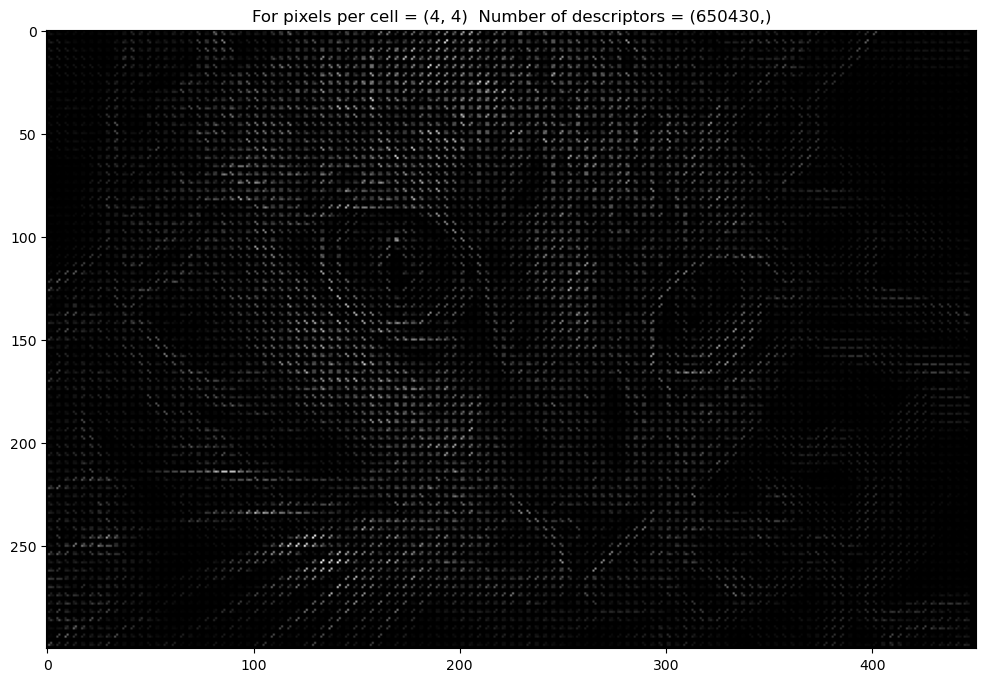

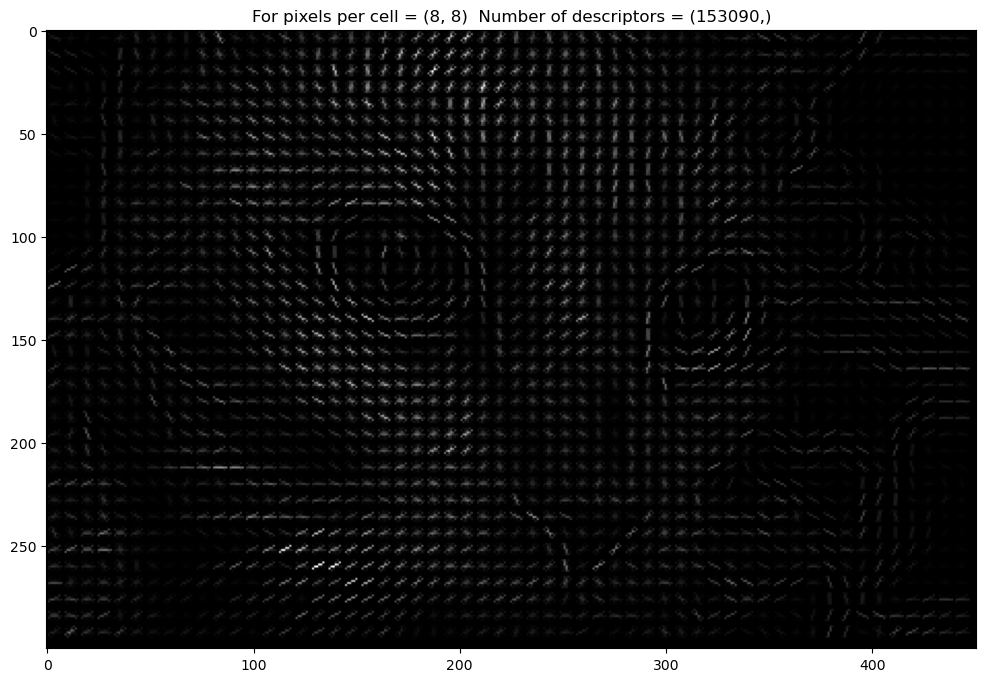

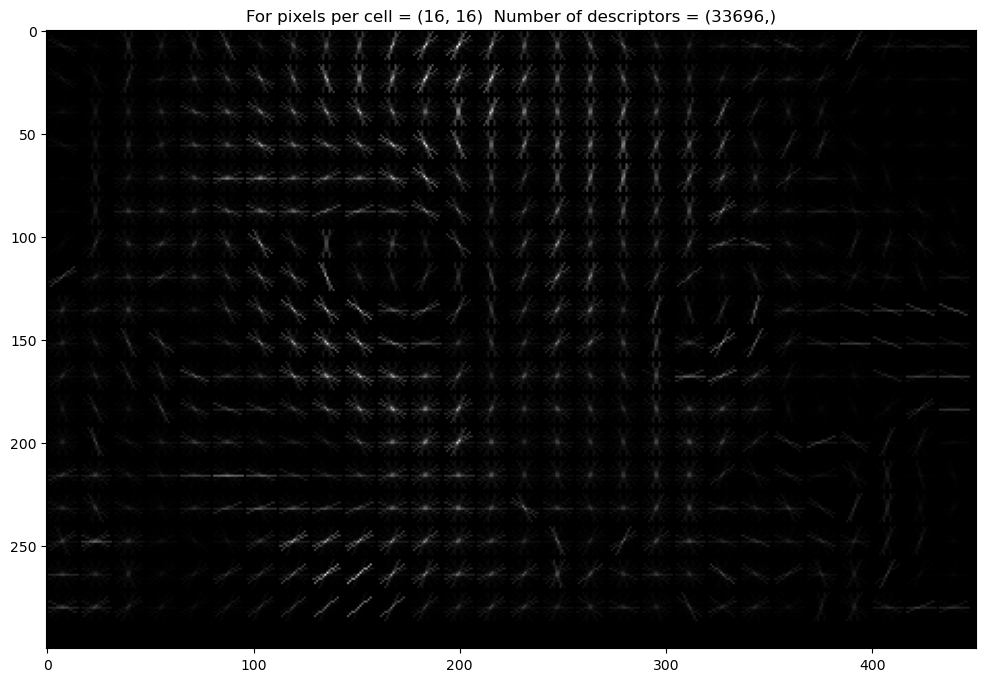

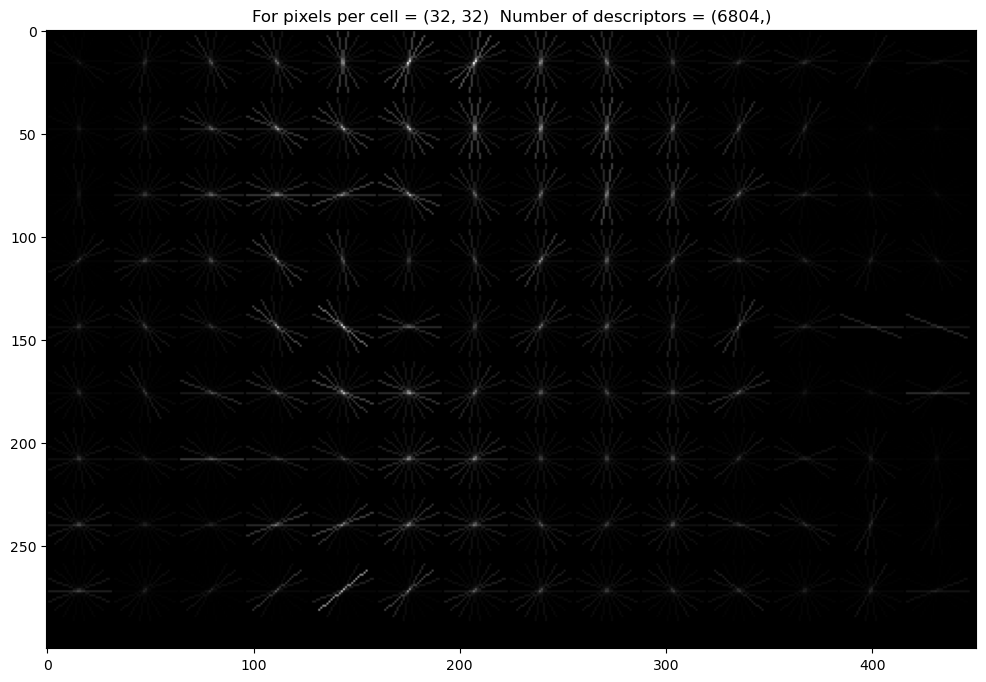

In [76]:
##  Your code goes here  
for pixels in [(4,4), (8,8), (16,16), (32,32)]:
    cat_corner_orientations = skimage.feature.hog(cat_grayscale_equalized, pixels_per_cell=pixels, visualize=True)

    fig, ax = plt.subplots(figsize=(12,15))
    _=ax.imshow(cat_corner_orientations[1], cmap=plt.get_cmap('gray'))
    _=ax.set_title('For pixels per cell = ' + str(pixels) + '  Number of descriptors = ' + str(cat_corner_orientations[0].shape))

> Examine the results and answer the following questions:       
> 1. How has the density of the corner direction features changes as the pixels per cell dimensionality increases and why?      
> 2. How does the magnitude of the gradient change as the pixels per cell and scale increases and does this make sense given the algorithm and why?     
> 3. How does the smoothness and consistency of the gradient directions as the pixels per cell dimensionality or scale increases and does this make sense given the algorithm and why?   
> 4. As the size of the operator increases, you can see that the representation of the cat image changes, becoming more abstracted. If you goal is to robustly represent the object what do you think the trade-off will be and why?    
> **End of exercise.**

> **Answers:**    
> 1.  The densitry decreases. This makes perfect sense, because we are increasing the number of pixels going into each resulting cell, which is effectively just down-sampling the image.    
> 2.  The magnitudes increases. This is because we are counting more pixels per cell, so the number of observations in any given direction is likely to increases. 
> 3.  The gradients are smoother and more consistent, which is a mechanical feature of the algorithm. Because we have more pixels per cell, we are quashing the minute differences into more abstract trends. 
> 4.  The tradeoff is again bias-variance. You need to be able to generalize the basic contrours of the face meaning you cannot have too few pixels per cell. BUt if you over generalize, then you won't be able to tell a cat from a giraffe and therefore the resulting image will be useless from a CV standpoint.   

### The BRIEF Algorithm   

As with edge and corner detectors, a great many **interest point** or **key point** detection algorithms have been developed. Here we will only work with one, the BRIEF algorithm. The BRIEF algorithm creates a hash of the gradient directions over patches of the image. These hashes can be matched between images to find common interest points.                   

> **Exercise 3-8:** You will now apply the [sskimage.feature.BRIEF](https://scikit-image.org/docs/0.18.x/api/skimage.feature.html?highlight=brief#skimage.feature.BRIEF) function to the equalized gray-scale cat image by the following steps:     
> 1. Apply the Harris corner detection algorithm to the equalized gray-scale cat image. 
> 2. Find the Harris corner peaks with `min_distance=5`, and print the number of peaks found. 
> 3. Initialize the BRIEF feature extractor with `patch_size=5`.
> 4. Extract the BRIEF descriptor hashes from the cat gray-scale image and the corner peaks found. The function returns an object with many attributes. The descriptor hash is the `.descriptor` attribute. 
> 5. Print the first 4 hashes, being careful to label them.      
> 6.  Compute the [**Hamming similarity**](https://en.wikipedia.org/wiki/Hamming_distance) between the first hash and all subsequent hashes.  
> 7. Display a histogram of the Hamming distances using 30 bins and the range limited to the possible similarity values. Make sure you label the axes and provide a meaningful title for your chart. 

In [109]:
sum(BRIEF.descriptors[0] != BRIEF.descriptors[3])

93

In [115]:
BRIEF = skimage.feature.BRIEF(patch_size=5)

BRIEF.extract(cat_grayscale_equalized, cat_harris_peaks)

similarity = []

for i in range(0, len(BRIEF.descriptors)):

    print("="*100)
    print(f"Hash Number : {i}")
    #print(BRIEF.descriptors[i])
    hamming_distance = sum(BRIEF.descriptors[0] != BRIEF.descriptors[i])
    print(f"Hamming distance between current hash and hash 0 = {hamming_distance}")
    similarity.append(hamming_distance)

Hash Number : 0
Hamming distance between current hash and hash 0 = 0
Hash Number : 1
Hamming distance between current hash and hash 0 = 1
Hash Number : 2
Hamming distance between current hash and hash 0 = 63
Hash Number : 3
Hamming distance between current hash and hash 0 = 93
Hash Number : 4
Hamming distance between current hash and hash 0 = 37
Hash Number : 5
Hamming distance between current hash and hash 0 = 94
Hash Number : 6
Hamming distance between current hash and hash 0 = 78
Hash Number : 7
Hamming distance between current hash and hash 0 = 62
Hash Number : 8
Hamming distance between current hash and hash 0 = 46
Hash Number : 9
Hamming distance between current hash and hash 0 = 50
Hash Number : 10
Hamming distance between current hash and hash 0 = 28
Hash Number : 11
Hamming distance between current hash and hash 0 = 25
Hash Number : 12
Hamming distance between current hash and hash 0 = 51
Hash Number : 13
Hamming distance between current hash and hash 0 = 55
Hash Number : 14
H

number of peaks found = 395
Hash Number : 0
Hamming distance between current hash and hash 0 = 0
Hash Number : 1
Hamming distance between current hash and hash 0 = 1
Hash Number : 2
Hamming distance between current hash and hash 0 = 63
Hash Number : 3
Hamming distance between current hash and hash 0 = 93
Hash Number : 4
Hamming distance between current hash and hash 0 = 37
Hash Number : 5
Hamming distance between current hash and hash 0 = 94
Hash Number : 6
Hamming distance between current hash and hash 0 = 78
Hash Number : 7
Hamming distance between current hash and hash 0 = 62
Hash Number : 8
Hamming distance between current hash and hash 0 = 46
Hash Number : 9
Hamming distance between current hash and hash 0 = 50
Hash Number : 10
Hamming distance between current hash and hash 0 = 28
Hash Number : 11
Hamming distance between current hash and hash 0 = 25
Hash Number : 12
Hamming distance between current hash and hash 0 = 51
Hash Number : 13
Hamming distance between current hash and ha

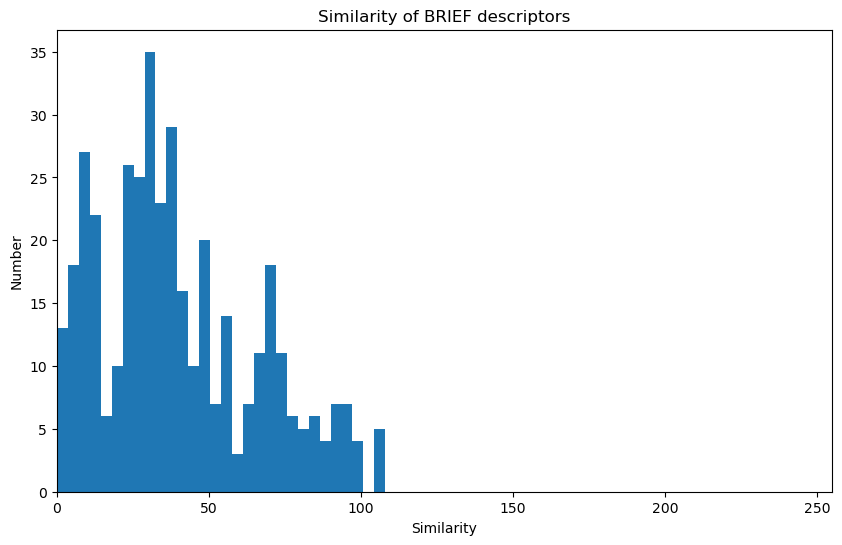

In [118]:
##  Your code goes here  
cat_harris_peaks = skimage.feature.corner_peaks(cat_grayscale_equalized, min_distance=5)
print(f"number of peaks found = {len(cat_harris_peaks)}")

BRIEF = skimage.feature.BRIEF(patch_size=5)

BRIEF.extract(cat_grayscale_equalized, cat_harris_peaks)

similarity = []

for i in range(0, len(BRIEF.descriptors)):

    print("="*100)
    print(f"Hash Number : {i}")
    #print(BRIEF.descriptors[i])
    hamming_distance = sum(BRIEF.descriptors[0] != BRIEF.descriptors[i])
    print(f"Hamming distance between current hash and hash 0 = {hamming_distance}")
    similarity.append(hamming_distance)

   
fig, ax = plt.subplots(figsize=(10,6))
plt.hist(similarity, bins=30)
plt.xlim((0,255))
_=plt.xlabel('Similarity')
_=plt.ylabel('Number')
_=plt.title('Similarity of BRIEF descriptors')

> Examine histogram of the hash similarity values. Keeping in mind the maximum and minimum possible values, what statement can you make about how strong the similarity is between these interest points. Try to explain your reasoning.         
> **End of exercise.**

> **Answer:**  
The minimum distance is zero (all same) and the maximum is 395 (all different). Therefore, the fact that the nearly all of the hashes have a distance less than 100 means that almost every hash is no more than 25% different from the first hash. This seems to be very similar to me.        

## Texture       

Texture is a ubiquitous feature of nearly all images. However, stating exactly what texture is, and how to measure it, is not simple or strait forward. In general, we can say that texture is a function of local variation of the image. Typical measures used to quantify texture are:     
- Covariance over local patches of the image where regions with higher covariance have rougher textures.       
- Entropy computed over local patches of the image where regions with higher entropy have rougher textures.   

Here we will focus on local entropy to measure texture using the [skimage.filters.rank.entropy](https://scikit-image.org/docs/dev/api/skimage.filters.rank.html#skimage.filters.rank.entropy) function. 
ids

> **Exercise 3-9:** You will now use local entropy  as a measure of texture on the equalized gray-scale cat image by doing the following.    
> 1. Iterate over the disk patch radii, $[3,6,12,24,48,96]$, and for each value do each of the following steps. 
> 2. Compute the local entropy of the equalized gray-scale cat image using the [skimage.morphology.disk](https://scikit-image.org/docs/dev/api/skimage.morphology.html#skimage.morphology.disk) for the patch argument, and using the diameter value. Make sure you convert the image to unsigned 8-bit integer with [skimage.util.img_as_ubyte](https://scikit-image.org/docs/dev/api/skimage.util.html#skimage.util.img_as_ubyte).    
> 3. Side by side, display the image and a histogram of the entropy values with 50 bins. Include a title with the disk diameter and axes labels for the histogram.    

In [125]:
radius = 3
cat_entropy = skimage.filters.rank.entropy(cat_grayscale_equalized, skimage.morphology.disk(radius))

C:\Users\bctur\AppData\Local\Temp\ipykernel_1392\2091479864.py:2: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  skimage.filters.rank.entropy(cat_grayscale_equalized, skimage.morphology.disk(radius))


array([[2.84535094, 3.12808528, 2.98423416, ..., 2.63129299, 2.41379956,
        2.41308844],
       [3.32486296, 3.30827083, 3.50399753, ..., 3.17467423, 3.04411042,
        2.84237099],
       [3.57246946, 3.66353275, 3.78212222, ..., 3.27806147, 3.32217935,
        3.17512314],
       ...,
       [3.69011652, 4.15239128, 4.50470648, ..., 3.93027037, 3.75444185,
        3.29277019],
       [3.66449778, 4.05881389, 4.36852253, ..., 3.5383106 , 3.57243125,
        3.18200581],
       [3.45943162, 3.80735492, 4.08746284, ..., 3.33717534, 3.18200581,
        2.84535094]])

C:\Users\bctur\AppData\Local\Temp\ipykernel_1392\3753381480.py:4: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  cat_entropy = skimage.filters.rank.entropy(cat_grayscale_equalized, skimage.morphology.disk(radii))


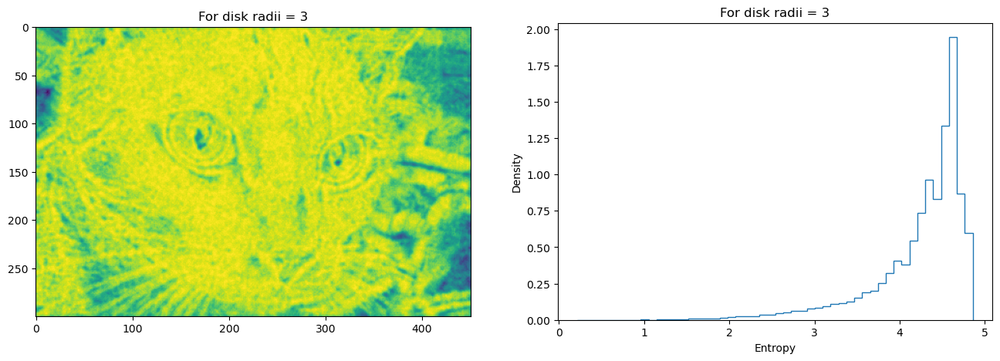

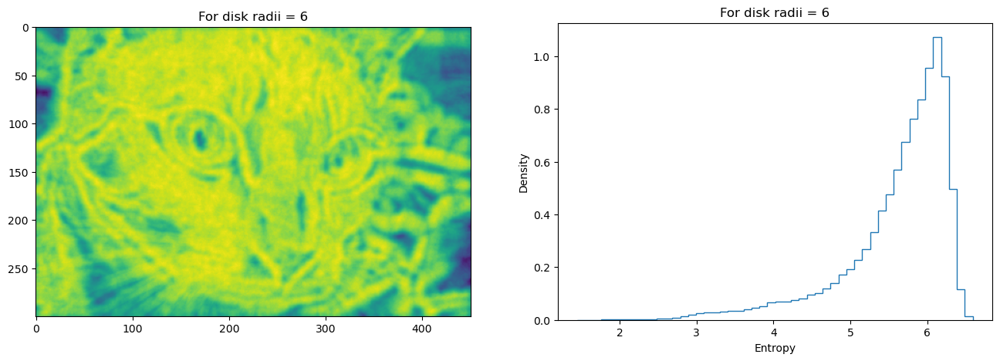

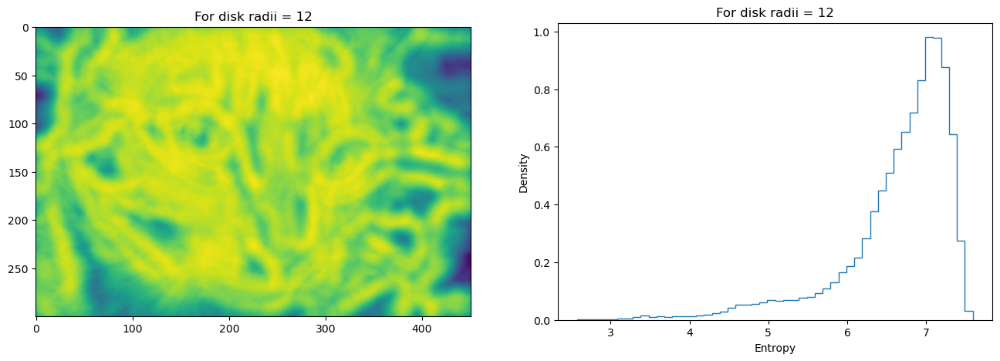

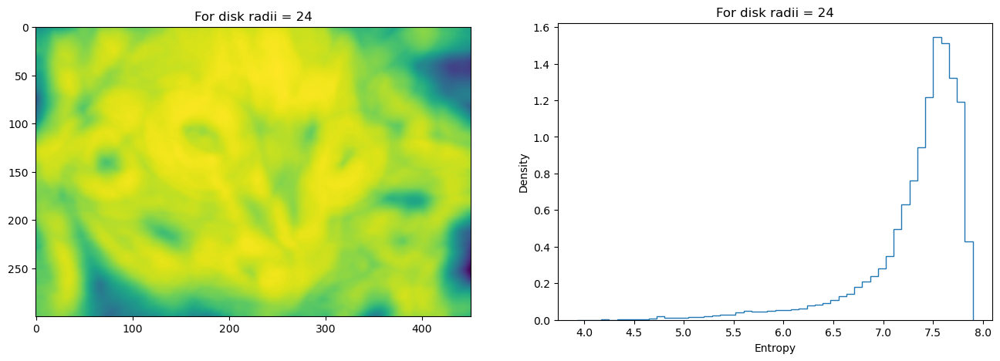

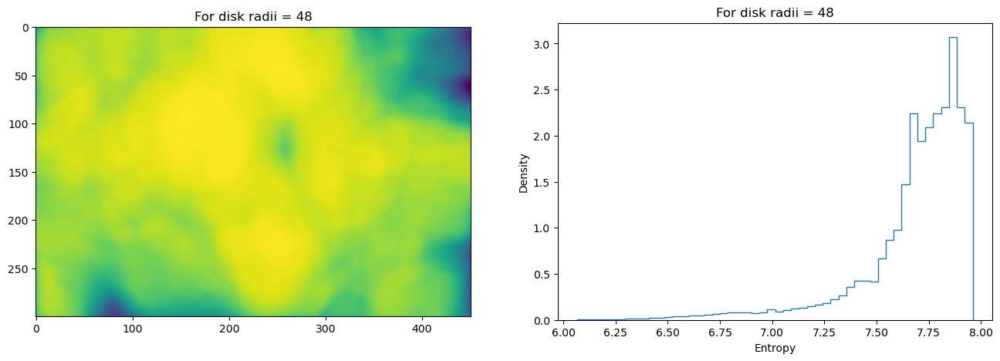

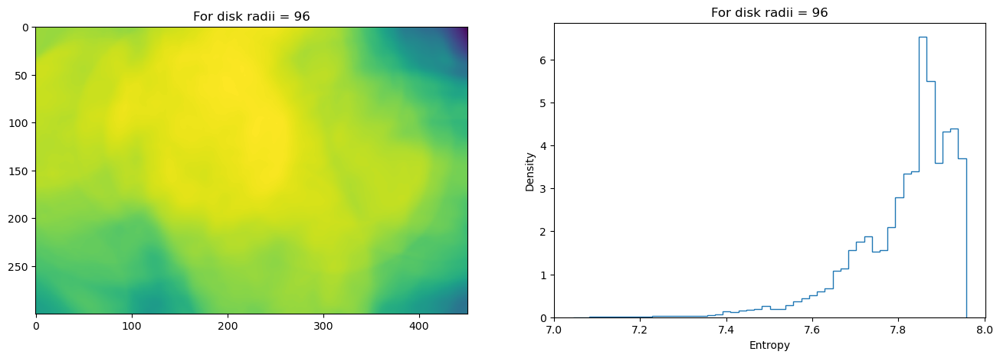

In [129]:
##  Your code goes here  

for radii in [3, 6, 12, 24, 48, 96]:
    cat_entropy = skimage.filters.rank.entropy(cat_grayscale_equalized, skimage.morphology.disk(radii))
    fig, ax = plt.subplots(1, 2, figsize=(16,5))
    _=ax[0].imshow(cat_entropy)
    _=ax[0].set_title('For disk radii = ' + str(radii))
    _=ax[1].hist(cat_entropy.flatten(), density=True, bins=50, histtype='step')
    _=ax[1].set_title('For disk radii = ' + str(radii))
    _=ax[1].set_ylabel('Density')
    _=ax[1].set_xlabel('Entropy')

> Examine these results and answer the following questions:     
> 1. How can you describe the change in the image with operator diameter, and what does this tell you about the scale of the features?    
> 2. At what scale does the histogram exhibit distinctly multi=modal behavior, and what does this mean in terms of possibly segmenting the image into regions with common properties?   
> **End of exercise.**

> **Answers:**    
> 1.  The image quickly converges into a blob of color. This tells me that the features present in this image are very fine and, in some respect, miniscule.   
> 2.  At radius = 48 we can see a clear second spike, though it does no quite approach a new/second modal value. This is a good cutoff point for segmentation.    

Local entropy shows texture properties of an image. There are several uses for these properties in CV algorithm. Segmentation of an image into regions by texture is one such algorithm. 

The code in the cell below segments the image into 3 regions by value of the entropy. Execute the code and examine the result. 

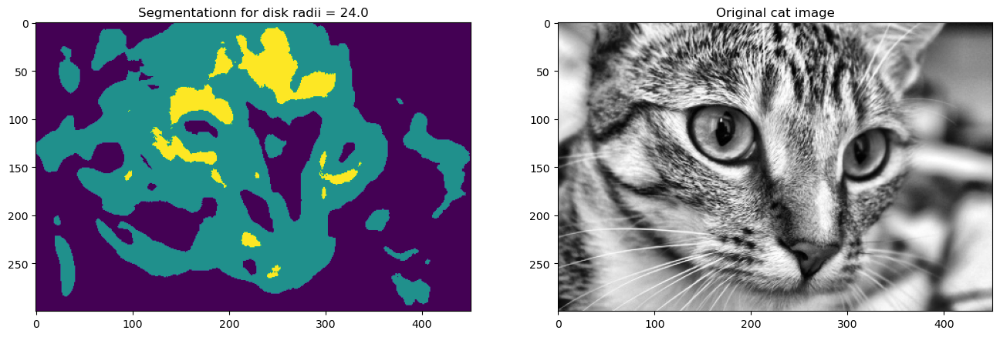

In [130]:
radii = 24.0 
threshold1 = 7.8
threshold2 = 7.5
cat_entropy_96 = entropy(util.img_as_ubyte(cat_grayscale_equalized), morphology.disk(radii))
cat_entropy_96 = np.where(cat_entropy_96 > threshold1, 1.0, np.where(cat_entropy_96 > threshold2, 0.5, 0.0))

fig, ax = plt.subplots(1, 2, figsize=(16,5))
ax = ax.flatten()
_=ax[0].imshow(cat_entropy_96)
_=ax[0].set_title('Segmentationn for disk radii = ' + str(radii))
_=ax[1].imshow(cat_grayscale_equalized, cmap=plt.get_cmap('gray'))
_=ax[1].set_title('Original cat image')

Compare the regions found by the segmentation to the original gray-scale image. Notice how the segmentation of the image by texture reasonably matches the large-scale features of the cat image. This segmentation could be used to mask the areas of image of interest, for example.       

#### Copyright 2021, Stephen F Elston. All rights reserved.